In [84]:
import numpy as np
import pandas as pd
import nltk
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
from sklearn.decomposition import PCA
from scipy.spatial.distance import pdist
import scipy.cluster.hierarchy as sch
from scipy.cluster.vq import kmeans
from gensim.models import word2vec
from sklearn.manifold import TSNE
from sklearn.feature_extraction.text import TfidfVectorizer

### Load Data

#### OHCO Levels

In [2]:
OHCO = ["paper_id","section_num","para_num","sent_num","token_num"]
SENTS = OHCO[:4]
PARAS = OHCO[:3]
SECTIONS = OHCO[:2]
PAPERS = OHCO[:1]

#### File Path

- change accordingly

In [123]:
complete_data_path = '../dataset/processed-files/covid19_papers.csv'
lib_path = '../dataset/processed-files/LIB_V.csv'
token_path = '../dataset/processed-files/TOKEN_V.csv'
vocab_path = '../dataset/processed-files/VOCAB_V.csv'
tfidf_path = '../dataset/processed-files/TFIDF_COVID_PAPERS.csv'
loadings_path = '../dataset/processed-files/LOADINGS_V.csv'
emb_path = '../dataset/processed-files/EMBEDDINGS_V.csv'

#### Complete Data

In [4]:
data = pd.read_csv(complete_data_path)
data

,paper_id,text,journal,publish_year,is_covid19,section_num,publish_month,type
0,24a61244c69f09bc9392bbbb4a97e881ee68dc5e,African swine fever virus (ASFV) is a dsDNA vi...,Cell Discov,2020,True,0,4,commercial
1,12332e3ee5f8253ed8db253e1acb48ea3bc8f27f,OBJECTIVE: According to the WHO coronavirus di...,BMC Res Notes,2020,True,0,4,commercial
2,655b175741b74ae8c98f93fd449c88a147bee96e,"INTRODUCTION: In the beginning of 2020, an une...",Arch Acad Emerg Med,2020,True,0,3,commercial
3,188f3e97042155ac1709aa8b74c0755760c3b50d,BACKGROUND: Cancer and transplant patients wit...,Ecancermedicalscience,2020,True,0,3,commercial
4,80993091f576dc7fdbec10552b45b4af5eec2b8b,The ongoing COVID-19 epidemic continues to spr...,J Clin Med,2020,True,0,2,commercial
...,...,...,...,...,...,...,...,...
129,4b29b65801480de25dd4b503bfd7939a1884b97e,There were 220 medical staff who were initiall...,Med Sci Monit,2020,True,1,3,non commercial
130,14591bae9b4cf2cfdbd409c0dec9106a13298297,There were 200 people who were initially invit...,Med Sci Monit,2020,True,1,3,non commercial
131,4b36607cdbc54f8006161a9a1839489dd0a51269,The majority of study participants were males ...,Int Health,2020,True,1,2,non commercial
132,606233835c3d6d195b7d230745ccb0fded626aa7,To obtain a general profile of the case distri...,Chin Med J (Engl),2020,True,1,1,non commercial


#### LIB Table

In [5]:
LIB = pd.read_csv(lib_path)
LIB

,paper_id,journal,publish_year,publish_month,type
0,01213aa45eeb8088eea6f64614ccc066e2321f73,PLoS One,2020,3,commercial
1,018269476cd191365d6b8bed046078aea07c8c01,Infectious Diseases of Poverty,2020,1,commercial
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,Arch Acad Emerg Med,2020,3,commercial
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,Osong Public Health Res Perspect,2020,4,non commercial
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,JAMA Netw Open,2020,3,commercial
...,...,...,...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,Eye Vis (Lond),2020,4,commercial
63,ed6e34937c0ad11574f619e32adab283699082c9,Ann Intensive Care,2020,3,commercial
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,Arch Acad Emerg Med,2020,3,commercial
65,f8c15039fad3e71a1479b9d09516aad16fc52f70,Int J Biol Sci,2020,3,commercial


#### TOKEN Table

In [6]:
TOKEN = pd.read_csv(token_path)
TOKEN = TOKEN[~TOKEN.term_str.isna()]
TOKEN

,paper_id,section_num,para_num,sent_num,token_num,token_str,pos_tuple,pos,term_str
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,0,Radiologic,"('Radiologic', 'NNP')",NNP,radiologic
1,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,1,characteristics,"('characteristics', 'NNS')",NNS,characteristics
2,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,2,of,"('of', 'IN')",IN,of
3,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,3,2019,"('2019', 'CD')",CD,2019
4,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,4,novel,"('novel', 'JJ')",JJ,novel
...,...,...,...,...,...,...,...,...,...
76597,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,13,changes,"('changes', 'NNS')",NNS,changes
76598,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,14,Supplementary,"('Supplementary', 'JJ')",JJ,supplementary
76599,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,15,information,"('information', 'NN')",NN,information
76600,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,16,Fig,"('Fig', 'NNP')",NNP,fig


#### VOCAB Table

In [7]:
VOCAB = pd.read_csv(vocab_path)
VOCAB = VOCAB[~VOCAB.term_str.isna()]
VOCAB

,term_id,term_str,n,num,stop_words,stem_porter,stem_snowball,stem_lancaster
0,0,0,599,1,0,0,0,0
1,1,00,6,1,0,00,00,00
2,2,00001,11,1,0,00001,00001,00001
3,3,0001,17,1,0,0001,0001,0001
4,4,0004,1,1,0,0004,0004,0004
...,...,...,...,...,...,...,...,...
6787,6787,ρ,4,0,0,ρ,ρ,ρ
6788,6788,φ6,6,0,0,φ6,φ6,φ6
6789,6789,φx174,9,0,0,φx174,φx174,φx174
6790,6790,χ2,1,0,0,χ2,χ2,χ2


### Prepare Data

#### Add term_id to TOKEN table

In [8]:
TOKEN['term_id'] = TOKEN.term_str.map(VOCAB.reset_index().set_index('term_str').term_id)
TOKEN

,paper_id,section_num,para_num,sent_num,token_num,token_str,pos_tuple,pos,term_str,term_id
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,0,Radiologic,"('Radiologic', 'NNP')",NNP,radiologic,5062
1,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,1,characteristics,"('characteristics', 'NNS')",NNS,characteristics,1350
2,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,2,of,"('of', 'IN')",IN,of,4355
3,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,3,2019,"('2019', 'CD')",CD,2019,177
4,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,4,novel,"('novel', 'JJ')",JJ,novel,4282
...,...,...,...,...,...,...,...,...,...,...
76597,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,13,changes,"('changes', 'NNS')",NNS,changes,1345
76598,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,14,Supplementary,"('Supplementary', 'JJ')",JJ,supplementary,6014
76599,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,15,information,"('information', 'NN')",NN,information,3343
76600,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,16,Fig,"('Fig', 'NNP')",NNP,fig,2630


#### Add stem_porter to TOKEN table

In [9]:
TOKEN['stem_porter'] = TOKEN.term_id.map(VOCAB.stem_porter)
TOKEN

,paper_id,section_num,para_num,sent_num,token_num,token_str,pos_tuple,pos,term_str,term_id,stem_porter
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,0,Radiologic,"('Radiologic', 'NNP')",NNP,radiologic,5062,radiolog
1,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,1,characteristics,"('characteristics', 'NNS')",NNS,characteristics,1350,characterist
2,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,2,of,"('of', 'IN')",IN,of,4355,of
3,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,3,2019,"('2019', 'CD')",CD,2019,177,2019
4,01213aa45eeb8088eea6f64614ccc066e2321f73,0,0,0,4,novel,"('novel', 'JJ')",JJ,novel,4282,novel
...,...,...,...,...,...,...,...,...,...,...,...
76597,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,13,changes,"('changes', 'NNS')",NNS,changes,1345,chang
76598,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,14,Supplementary,"('Supplementary', 'JJ')",JJ,supplementary,6014,supplementari
76599,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,15,information,"('information', 'NN')",NN,information,3343,inform
76600,fb030202bbf50ba56922ea88b06dc78327028b26,1,0,192,16,Fig,"('Fig', 'NNP')",NNP,fig,2630,fig


#### Add max POS to VOCAB

In [10]:
VOCAB['pos_max'] = TOKEN.groupby(['term_id', 'pos']).pos.count().unstack().idxmax(1)
VOCAB

,term_id,term_str,n,num,stop_words,stem_porter,stem_snowball,stem_lancaster,pos_max
0,0,0,599,1,0,0,0,0,CD
1,1,00,6,1,0,00,00,00,CD
2,2,00001,11,1,0,00001,00001,00001,CD
3,3,0001,17,1,0,0001,0001,0001,CD
4,4,0004,1,1,0,0004,0004,0004,CD
...,...,...,...,...,...,...,...,...,...
6787,6787,ρ,4,0,0,ρ,ρ,ρ,$
6788,6788,φ6,6,0,0,φ6,φ6,φ6,NNP
6789,6789,φx174,9,0,0,φx174,φx174,φx174,NNP
6790,6790,χ2,1,0,0,χ2,χ2,χ2,NN


### Compute TF-IDF

#### TF-IDF at the level of papers

In [52]:
## Get text at the level of papers
papers_corpus = data.groupby(PAPERS)['text'].apply(lambda x: ' '.join(x)).to_frame().reset_index()
papers_corpus

,paper_id,text
0,01213aa45eeb8088eea6f64614ccc066e2321f73,Radiologic characteristics of 2019 novel coron...
1,018269476cd191365d6b8bed046078aea07c8c01,Background As reported by the World Health Org...
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,INTRODUCTION: The outbreak of the new Coronavi...
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,OBJECTIVES: Case fatality rates (CFR) and reco...
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,IMPORTANCE: Health care workers exposed to cor...
...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,The 2019 novel coronavirus disease (COVID-19) ...
63,ed6e34937c0ad11574f619e32adab283699082c9,BACKGROUND: The outbreak of a novel coronaviru...
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,SARS-CoV-2 is a newly emerging human infectiou...
65,f8c15039fad3e71a1479b9d09516aad16fc52f70,"As a city famous for tourism, the public healt..."


In [12]:
## tokenize method used to split text and get the TOKEN table
def tokenize(text):
    return [word for word in nltk.word_tokenize(text) if word.isalnum()]

In [13]:
## vectorize using TFIDF vectorizer
tfidf_vectorizer = TfidfVectorizer(tokenizer=tokenize)
tfidf_papers = tfidf_vectorizer.fit_transform(papers_corpus.text.to_list())
tfidf_papers

<67x6618 sparse matrix of type '<class 'numpy.float64'>'
	with 23372 stored elements in Compressed Sparse Row format>

In [14]:
## tfidf matrix as dataframe
tfidf_papers_df = pd.DataFrame(tfidf_papers.toarray())
tfidf_papers_df

,0,1,2,3,4,5,6,7,8,9,...,6608,6609,6610,6611,6612,6613,6614,6615,6616,6617
0,0.017161,0.0,0.0,0.008931,0.038085,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
1,0.134702,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.157065
2,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
3,0.000000,0.0,0.0,0.018763,0.013335,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
4,0.000000,0.0,0.0,0.008008,0.011382,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
63,0.015707,0.0,0.0,0.008175,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
64,0.000000,0.0,0.0,0.011124,0.063249,0.048722,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
65,0.011786,0.0,0.0,0.006134,0.069752,0.080598,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000


In [15]:
## compute sum for each term_str
tfidf_papers_sum = pd.DataFrame(tfidf_papers.sum(axis=0).T)
tfidf_papers_sum.rename(columns = {0: 'tfidf_sum'}, inplace=True)
tfidf_papers_sum

,tfidf_sum
0,0.491390
1,0.010195
2,0.019505
3,1.381222
4,0.795451
...,...
6613,0.150482
6614,0.076093
6615,0.114139
6616,0.018424


In [16]:
## Get vocabulary mapping for tokens
tfidf_vocab_mapping = pd.DataFrame(tfidf_vectorizer.vocabulary_, index=[0]).T.reset_index()

In [17]:
tfidf_vocab_mapping.rename(columns = {'index': 'term_str'}, inplace = True)
tfidf_vocab_mapping

,term_str,0
0,radiologic,4890
1,characteristics,1185
2,of,4184
3,2019,117
4,novel,4111
...,...,...
6613,s6a,5281
6614,histopathological,2885
6615,vacuolation,6313
6616,degeneration,1717


In [18]:
tfidf_vocab_mapping = tfidf_vocab_mapping.set_index(0).sort_index()
tfidf_vocab_mapping.index.name = None
tfidf_vocab_mapping

,term_str
0,0
1,02
2,0t
3,1
4,10
...,...
6613,ρ
6614,φ6
6615,φx174
6616,χ2


In [19]:
tfidf_papers_sum = tfidf_vocab_mapping.merge(tfidf_papers_sum, left_index=True, right_index=True)
tfidf_papers_sum

,term_str,tfidf_sum
0,0,0.491390
1,02,0.010195
2,0t,0.019505
3,1,1.381222
4,10,0.795451
...,...,...
6613,ρ,0.150482
6614,φ6,0.076093
6615,φx174,0.114139
6616,χ2,0.018424


In [20]:
tfidf_papers_sum = tfidf_papers_sum.merge(VOCAB[['term_str', 'term_id']], on = 'term_str')
tfidf_papers_sum

,term_str,tfidf_sum,term_id
0,0,0.491390,0
1,02,0.010195,22
2,0t,0.019505,54
3,1,1.381222,55
4,10,0.795451,56
...,...,...,...
6613,ρ,0.150482,6787
6614,φ6,0.076093,6788
6615,φx174,0.114139,6789
6616,χ2,0.018424,6790


In [21]:
## dictionary containing mapping of tfidf generated term ids with VOCAB term ids
col_mapper = dict(zip(tfidf_papers_sum.index.values, tfidf_papers_sum.term_id))

In [22]:
## rename the columns of tfidf matrix dataframe to coincide with the term_id in the VOCAB table
tfidf_papers_df = tfidf_papers_df.rename(columns=col_mapper)

In [23]:
## add paper_id to the tfidf matrix
tfidf_papers_df['paper_id'] = papers_corpus.paper_id
tfidf_papers_df

,0,22,54,55,56,57,58,59,60,61,...,6783,6784,6785,6786,6787,6788,6789,6790,6791,paper_id
0,0.017161,0.0,0.0,0.008931,0.038085,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,01213aa45eeb8088eea6f64614ccc066e2321f73
1,0.134702,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.157065,018269476cd191365d6b8bed046078aea07c8c01
2,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0212e200dc708984bda32b474aa6a1437c6a3c3d
3,0.000000,0.0,0.0,0.018763,0.013335,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,08a6e7924103b4a001ff84d7db7dcd5560950fa1
4,0.000000,0.0,0.0,0.008008,0.011382,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,0a08fddd9dcee1b1254a05b49113521bbc423ccd
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8
63,0.015707,0.0,0.0,0.008175,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,ed6e34937c0ad11574f619e32adab283699082c9
64,0.000000,0.0,0.0,0.011124,0.063249,0.048722,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,f0b09e91c6b3d3a40d43110d256198b5c85a0d86
65,0.011786,0.0,0.0,0.006134,0.069752,0.080598,0.0,0.0,0.0,0.0,...,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000,f8c15039fad3e71a1479b9d09516aad16fc52f70


In [24]:
## reorder columns
cols = list(tfidf_papers_df.columns)
cols = [cols[-1]] + cols[:-1]
tfidf_papers_df = tfidf_papers_df[cols]
tfidf_papers_df

,paper_id,0,22,54,55,56,57,58,59,60,...,6782,6783,6784,6785,6786,6787,6788,6789,6790,6791
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0.017161,0.0,0.0,0.008931,0.038085,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
1,018269476cd191365d6b8bed046078aea07c8c01,0.134702,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.157065
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,0.000000,0.0,0.0,0.018763,0.013335,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,0.000000,0.0,0.0,0.008008,0.011382,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
63,ed6e34937c0ad11574f619e32adab283699082c9,0.015707,0.0,0.0,0.008175,0.000000,0.000000,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,0.000000,0.0,0.0,0.011124,0.063249,0.048722,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
65,f8c15039fad3e71a1479b9d09516aad16fc52f70,0.011786,0.0,0.0,0.006134,0.069752,0.080598,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000


In [25]:
## save the tfidf matrix
tfidf_papers_df.to_csv(tfidf_path, index=False)

In [26]:
## terms that are not identified by the tfidf vectorizer
extra_terms = list(set(VOCAB.term_str.to_list()).difference(set(tfidf_papers_sum.term_str.to_list())))
len(extra_terms)

174

In [27]:
## merge the vocab table with the tfidf-sum for tokens
VOCAB = VOCAB.merge(tfidf_papers_sum, on=['term_str', 'term_id']).rename(columns={'tfidf_sum': 'tfidf_sum_papers'})
VOCAB

,term_id,term_str,n,num,stop_words,stem_porter,stem_snowball,stem_lancaster,pos_max,tfidf_sum_papers
0,0,0,599,1,0,0,0,0,CD,0.491390
1,22,02,9,1,0,02,02,02,CD,0.010195
2,54,0t,1,1,0,0t,0t,0t,CD,0.019505
3,55,1,398,1,0,1,1,1,CD,1.381222
4,56,10,122,1,0,10,10,10,CD,0.795451
...,...,...,...,...,...,...,...,...,...,...
6613,6787,ρ,4,0,0,ρ,ρ,ρ,$,0.150482
6614,6788,φ6,6,0,0,φ6,φ6,φ6,NNP,0.076093
6615,6789,φx174,9,0,0,φx174,φx174,φx174,NNP,0.114139
6616,6790,χ2,1,0,0,χ2,χ2,χ2,NN,0.018424


In [28]:
## remove extra terms from TOKEN table
TOKEN = TOKEN[~TOKEN.term_str.isin(extra_terms)]

#### Add term_rank to VOCAB Table

- we can all use a second metric and compare with it so that there are differences

In [29]:
VOCAB = VOCAB.sort_values('n', ascending=False).reset_index()
VOCAB.index.name = 'term_rank'
VOCAB = VOCAB.reset_index()
VOCAB['term_rank'] = VOCAB['term_rank'] + 1
VOCAB = VOCAB.drop(columns=['index'])
VOCAB

,term_rank,term_id,term_str,n,num,stop_words,stem_porter,stem_snowball,stem_lancaster,pos_max,tfidf_sum_papers
0,1,6160,the,4424,0,1,the,the,the,DT,19.959576
1,2,4355,of,3054,0,1,of,of,of,IN,13.433219
2,3,808,and,2611,0,1,and,and,and,CC,11.923320
3,4,3256,in,1941,0,1,in,in,in,IN,9.006024
4,5,6225,to,1582,0,1,to,to,to,TO,7.067337
...,...,...,...,...,...,...,...,...,...,...,...
6613,6614,4906,prohibitive,1,0,0,prohibit,prohibit,prohibit,JJ,0.014228
6614,6615,4907,project,1,0,0,project,project,project,NN,0.014228
6615,6616,2410,ethnicity,1,0,0,ethnic,ethnic,ethn,NN,0.014228
6616,6617,3540,jealousy,1,0,0,jealousi,jealousi,jealousy,JJ,0.037368


#### Visualize term_rank vs tfidf_sum

In [46]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum_papers', hover_name='term_str', hover_data=['n'], color='pos_max')

In [47]:
px.scatter(VOCAB, x='term_rank', y='tfidf_sum_papers', 
           hover_name='term_str', hover_data=['n'], color='pos_max', 
           log_x=True, log_y=True)

### Clustering

#### Create DOC Table

In [53]:
DOC = tfidf_papers_df.reset_index()[PAPERS]
DOC.index.name = 'doc_id'
DOC

,paper_id
doc_id,
0,01213aa45eeb8088eea6f64614ccc066e2321f73
1,018269476cd191365d6b8bed046078aea07c8c01
2,0212e200dc708984bda32b474aa6a1437c6a3c3d
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd
...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8
63,ed6e34937c0ad11574f619e32adab283699082c9
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86


In [80]:
DOC['title'] = LIB.type.map(str) + '/' + LIB.journal.map(str) + '/' + LIB.publish_year.map(str) + '-' + LIB.publish_month.map(str)
DOC

,paper_id,title
doc_id,,
0,01213aa45eeb8088eea6f64614ccc066e2321f73,commercial/PLoS One/2020-3
1,018269476cd191365d6b8bed046078aea07c8c01,commercial/Infectious Diseases of Poverty/2020-1
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,commercial/Arch Acad Emerg Med/2020-3
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,non commercial/Osong Public Health Res Perspec...
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,commercial/JAMA Netw Open/2020-3
...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,commercial/Eye Vis (Lond)/2020-4
63,ed6e34937c0ad11574f619e32adab283699082c9,commercial/Ann Intensive Care/2020-3
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,commercial/Arch Acad Emerg Med/2020-3


#### Create DOC Pairs

In [57]:
PAIRS = pd.DataFrame(index=pd.MultiIndex.from_product([DOC.index.tolist(), DOC.index.tolist()])).reset_index()
PAIRS = PAIRS[PAIRS.level_0 < PAIRS.level_1].set_index(['level_0','level_1'])
PAIRS.index.names = ['doc_a', 'doc_b']
PAIRS

Empty DataFrame
Columns: []
Index: [(0, 1), (0, 2), (0, 3), (0, 4), (0, 5), (0, 6), (0, 7), (0, 8), (0, 9), (0, 10), (0, 11), (0, 12), (0, 13), (0, 14), (0, 15), (0, 16), (0, 17), (0, 18), (0, 19), (0, 20), (0, 21), (0, 22), (0, 23), (0, 24), (0, 25), (0, 26), (0, 27), (0, 28), (0, 29), (0, 30), (0, 31), (0, 32), (0, 33), (0, 34), (0, 35), (0, 36), (0, 37), (0, 38), (0, 39), (0, 40), (0, 41), (0, 42), (0, 43), (0, 44), (0, 45), (0, 46), (0, 47), (0, 48), (0, 49), (0, 50), (0, 51), (0, 52), (0, 53), (0, 54), (0, 55), (0, 56), (0, 57), (0, 58), (0, 59), (0, 60), (0, 61), (0, 62), (0, 63), (0, 64), (0, 65), (0, 66), (1, 2), (1, 3), (1, 4), (1, 5), (1, 6), (1, 7), (1, 8), (1, 9), (1, 10), (1, 11), (1, 12), (1, 13), (1, 14), (1, 15), (1, 16), (1, 17), (1, 18), (1, 19), (1, 20), (1, 21), (1, 22), (1, 23), (1, 24), (1, 25), (1, 26), (1, 27), (1, 28), (1, 29), (1, 30), (1, 31), (1, 32), (1, 33), (1, 34), (1, 35), ...]

[2211 rows x 0 columns]

#### Compute Euclidean, Cosine, JensonShannon and Correlation Distance Metric between papers

In [59]:
PAIRS['euclidean'] = pdist(TFIDF, 'euclidean')
PAIRS

euclidean
doc_a doc_b           
0     1       1.264639
      2       1.203569
      3       1.276586
      4       1.113104
      5       1.242533
...                ...
63    65      1.186331
      66      1.301610
64    65      1.018264
      66      1.184153
65    66      1.177282

[2211 rows x 1 columns]

In [60]:
PAIRS['cosine'] = pdist(TFIDF, 'cosine')
PAIRS

euclidean    cosine
doc_a doc_b                     
0     1       1.264639  0.799656
      2       1.203569  0.724290
      3       1.276586  0.814836
      4       1.113104  0.619500
      5       1.242533  0.771944
...                ...       ...
63    65      1.186331  0.703691
      66      1.301610  0.847095
64    65      1.018264  0.518431
      66      1.184153  0.701109
65    66      1.177282  0.692996

[2211 rows x 2 columns]

In [61]:
PAIRS['js'] = pdist(TFIDF, 'jensenshannon')
PAIRS

euclidean    cosine        js
doc_a doc_b                               
0     1       1.264639  0.799656  0.751924
      2       1.203569  0.724290  0.718511
      3       1.276586  0.814836  0.740651
      4       1.113104  0.619500  0.694573
      5       1.242533  0.771944  0.757279
...                ...       ...       ...
63    65      1.186331  0.703691  0.703587
      66      1.301610  0.847095  0.750411
64    65      1.018264  0.518431  0.663908
      66      1.184153  0.701109  0.726328
65    66      1.177282  0.692996  0.721754

[2211 rows x 3 columns]

In [62]:
PAIRS['correlation'] = pdist(TFIDF, 'correlation')
PAIRS

euclidean    cosine        js  correlation
doc_a doc_b                                            
0     1       1.264639  0.799656  0.751924     0.810940
      2       1.203569  0.724290  0.718511     0.738061
      3       1.276586  0.814836  0.740651     0.825978
      4       1.113104  0.619500  0.694573     0.628826
      5       1.242533  0.771944  0.757279     0.788968
...                ...       ...       ...          ...
63    65      1.186331  0.703691  0.703587     0.713998
      66      1.301610  0.847095  0.750411     0.859015
64    65      1.018264  0.518431  0.663908     0.534498
      66      1.184153  0.701109  0.726328     0.720332
65    66      1.177282  0.692996  0.721754     0.713583

[2211 rows x 4 columns]

In [67]:
PAIRS.style.background_gradient()

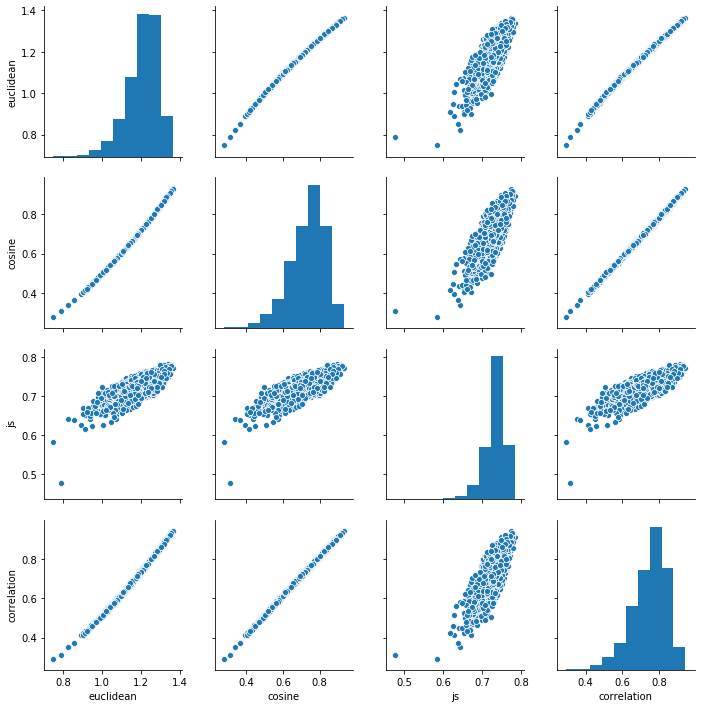

In [65]:
sns.pairplot(PAIRS)

#### Hierarchial Clustering

In [75]:
def plot_dendogram(sims, doc, linkage_method='ward', color_thresh=.3, figsize=(10, 20)):
    tree = sch.linkage(sims, method=linkage_method)
    labels = doc.title.values
    plt.figure()
    fig, axes = plt.subplots(figsize=figsize)
    dendrogram = sch.dendrogram(tree, 
                                labels=labels, 
                                orientation="left", 
                                count_sort=True,
                                distance_sort=True,
                                above_threshold_color='.75',
                                color_threshold=color_thresh)
    plt.tick_params(axis='both', which='major', labelsize=14)

<Figure size 432x288 with 0 Axes>

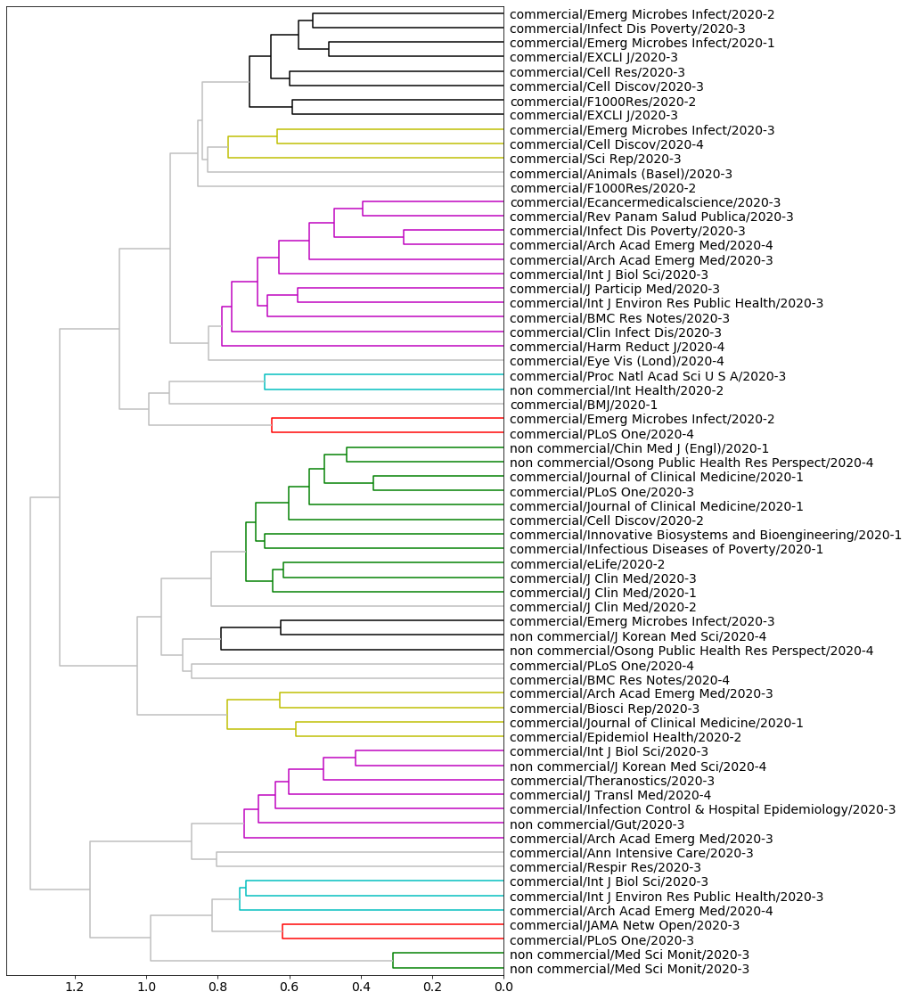

In [81]:
plot_dendogram(PAIRS.cosine, DOC, color_thresh=0.8)

<Figure size 432x288 with 0 Axes>

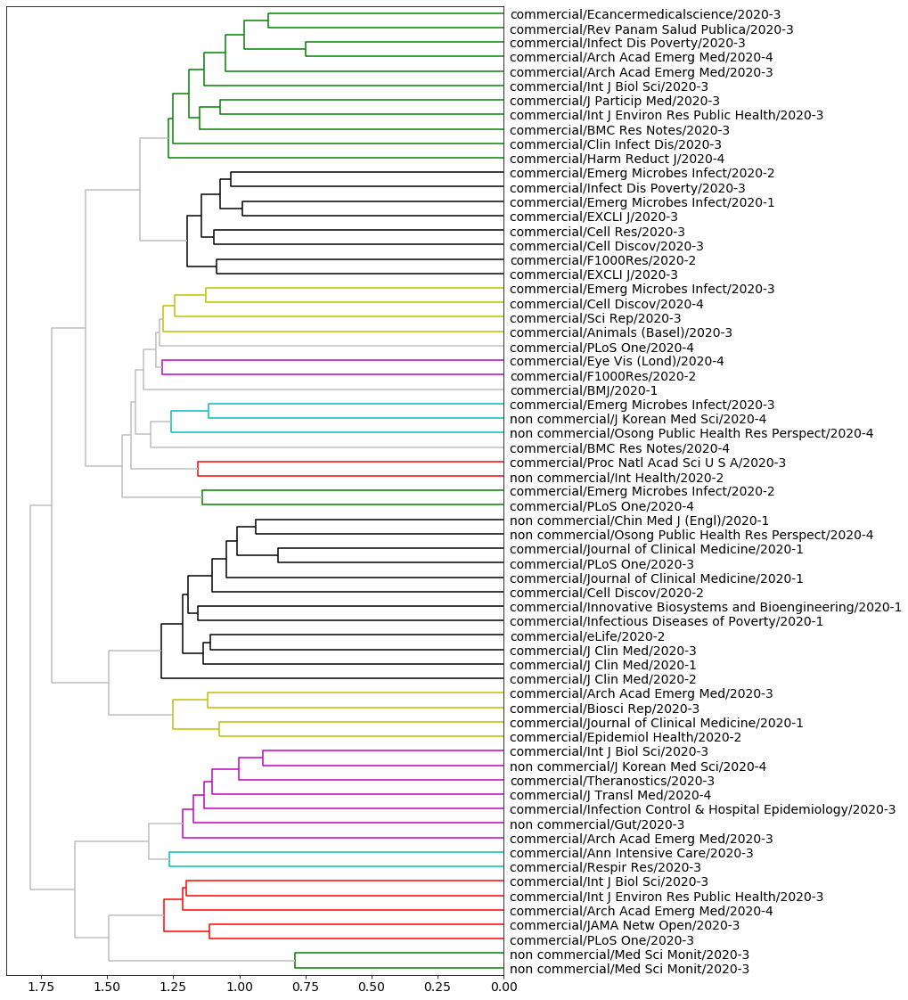

In [83]:
plot_dendogram(PAIRS.euclidean, DOC, color_thresh=1.3)

#### KMeans Clustering

### Principal Component Analysis

In [30]:
TFIDF = tfidf_papers_df.drop(columns = ['paper_id'])
TFIDF

,0,22,54,55,56,57,58,59,60,61,...,6782,6783,6784,6785,6786,6787,6788,6789,6790,6791
0,0.017161,0.0,0.0,0.008931,0.038085,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
1,0.134702,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.157065
2,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
3,0.000000,0.0,0.0,0.018763,0.013335,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
4,0.000000,0.0,0.0,0.008008,0.011382,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,0.000000,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
63,0.015707,0.0,0.0,0.008175,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
64,0.000000,0.0,0.0,0.011124,0.063249,0.048722,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000
65,0.011786,0.0,0.0,0.006134,0.069752,0.080598,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.000000


In [31]:
pca_engine = PCA(n_components=10)
DCM = pd.DataFrame(pca_engine.fit_transform(TFIDF))
DCM.columns = ['PC{}'.format(i) for i in DCM.columns]

In [32]:
## add paper_id as columns
DCM['paper_id'] = tfidf_papers_df['paper_id']
DCM

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,paper_id
0,0.387740,-0.062300,0.130688,0.169450,-0.000636,0.032403,-0.161211,-0.205444,0.135307,-0.179635,01213aa45eeb8088eea6f64614ccc066e2321f73
1,-0.215724,0.092010,0.112826,-0.008643,-0.174379,-0.045110,-0.031852,-0.005600,0.032314,0.004785,018269476cd191365d6b8bed046078aea07c8c01
2,0.100194,-0.093492,-0.003356,0.030303,0.161367,-0.046639,-0.043983,0.071723,0.153470,0.085736,0212e200dc708984bda32b474aa6a1437c6a3c3d
3,-0.001543,0.060911,0.081436,-0.097085,-0.029754,-0.097744,-0.122875,-0.016399,0.117129,0.518447,08a6e7924103b4a001ff84d7db7dcd5560950fa1
4,0.343761,0.252542,0.231290,0.138423,0.289574,0.016882,-0.085374,-0.322376,0.095937,-0.118537,0a08fddd9dcee1b1254a05b49113521bbc423ccd
...,...,...,...,...,...,...,...,...,...,...,...
62,0.027303,0.049687,-0.056688,-0.110834,0.002602,0.052079,0.086637,0.329436,0.135824,-0.083940,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8
63,0.385076,-0.036004,0.088776,-0.023124,-0.283374,0.238720,-0.085953,0.119660,-0.034085,0.113782,ed6e34937c0ad11574f619e32adab283699082c9
64,0.128264,-0.190058,-0.175410,0.064106,0.163502,0.068985,0.081196,0.140246,0.001573,0.123563,f0b09e91c6b3d3a40d43110d256198b5c85a0d86
65,0.265812,-0.384834,0.001496,0.066294,0.027195,-0.057220,0.087956,0.040176,-0.037002,-0.038359,f8c15039fad3e71a1479b9d09516aad16fc52f70


In [33]:
## reorder columns
cols = list(DCM.columns)
cols = [cols[-1]] + cols[:-1]
DCM = DCM[cols]
DCM

,paper_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0.387740,-0.062300,0.130688,0.169450,-0.000636,0.032403,-0.161211,-0.205444,0.135307,-0.179635
1,018269476cd191365d6b8bed046078aea07c8c01,-0.215724,0.092010,0.112826,-0.008643,-0.174379,-0.045110,-0.031852,-0.005600,0.032314,0.004785
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,0.100194,-0.093492,-0.003356,0.030303,0.161367,-0.046639,-0.043983,0.071723,0.153470,0.085736
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,-0.001543,0.060911,0.081436,-0.097085,-0.029754,-0.097744,-0.122875,-0.016399,0.117129,0.518447
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,0.343761,0.252542,0.231290,0.138423,0.289574,0.016882,-0.085374,-0.322376,0.095937,-0.118537
...,...,...,...,...,...,...,...,...,...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,0.027303,0.049687,-0.056688,-0.110834,0.002602,0.052079,0.086637,0.329436,0.135824,-0.083940
63,ed6e34937c0ad11574f619e32adab283699082c9,0.385076,-0.036004,0.088776,-0.023124,-0.283374,0.238720,-0.085953,0.119660,-0.034085,0.113782
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,0.128264,-0.190058,-0.175410,0.064106,0.163502,0.068985,0.081196,0.140246,0.001573,0.123563
65,f8c15039fad3e71a1479b9d09516aad16fc52f70,0.265812,-0.384834,0.001496,0.066294,0.027195,-0.057220,0.087956,0.040176,-0.037002,-0.038359


In [34]:
DCM = DCM.merge(LIB, on='paper_id')
DCM['doc'] = DCM.apply(lambda x: "{}-{}-{}".format(x.journal, x.publish_month, x.publish_year), 1)
DCM

,paper_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,journal,publish_year,publish_month,type,doc
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0.387740,-0.062300,0.130688,0.169450,-0.000636,0.032403,-0.161211,-0.205444,0.135307,-0.179635,PLoS One,2020,3,commercial,PLoS One-3-2020
1,018269476cd191365d6b8bed046078aea07c8c01,-0.215724,0.092010,0.112826,-0.008643,-0.174379,-0.045110,-0.031852,-0.005600,0.032314,0.004785,Infectious Diseases of Poverty,2020,1,commercial,Infectious Diseases of Poverty-1-2020
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,0.100194,-0.093492,-0.003356,0.030303,0.161367,-0.046639,-0.043983,0.071723,0.153470,0.085736,Arch Acad Emerg Med,2020,3,commercial,Arch Acad Emerg Med-3-2020
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,-0.001543,0.060911,0.081436,-0.097085,-0.029754,-0.097744,-0.122875,-0.016399,0.117129,0.518447,Osong Public Health Res Perspect,2020,4,non commercial,Osong Public Health Res Perspect-4-2020
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,0.343761,0.252542,0.231290,0.138423,0.289574,0.016882,-0.085374,-0.322376,0.095937,-0.118537,JAMA Netw Open,2020,3,commercial,JAMA Netw Open-3-2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,0.027303,0.049687,-0.056688,-0.110834,0.002602,0.052079,0.086637,0.329436,0.135824,-0.083940,Eye Vis (Lond),2020,4,commercial,Eye Vis (Lond)-4-2020
63,ed6e34937c0ad11574f619e32adab283699082c9,0.385076,-0.036004,0.088776,-0.023124,-0.283374,0.238720,-0.085953,0.119660,-0.034085,0.113782,Ann Intensive Care,2020,3,commercial,Ann Intensive Care-3-2020
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,0.128264,-0.190058,-0.175410,0.064106,0.163502,0.068985,0.081196,0.140246,0.001573,0.123563,Arch Acad Emerg Med,2020,3,commercial,Arch Acad Emerg Med-3-2020
65,f8c15039fad3e71a1479b9d09516aad16fc52f70,0.265812,-0.384834,0.001496,0.066294,0.027195,-0.057220,0.087956,0.040176,-0.037002,-0.038359,Int J Biol Sci,2020,3,commercial,Int J Biol Sci-3-2020


In [35]:
DCM['publish_month'] = DCM.publish_month.astype(str)
DCM

,paper_id,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,journal,publish_year,publish_month,type,doc
0,01213aa45eeb8088eea6f64614ccc066e2321f73,0.387740,-0.062300,0.130688,0.169450,-0.000636,0.032403,-0.161211,-0.205444,0.135307,-0.179635,PLoS One,2020,3,commercial,PLoS One-3-2020
1,018269476cd191365d6b8bed046078aea07c8c01,-0.215724,0.092010,0.112826,-0.008643,-0.174379,-0.045110,-0.031852,-0.005600,0.032314,0.004785,Infectious Diseases of Poverty,2020,1,commercial,Infectious Diseases of Poverty-1-2020
2,0212e200dc708984bda32b474aa6a1437c6a3c3d,0.100194,-0.093492,-0.003356,0.030303,0.161367,-0.046639,-0.043983,0.071723,0.153470,0.085736,Arch Acad Emerg Med,2020,3,commercial,Arch Acad Emerg Med-3-2020
3,08a6e7924103b4a001ff84d7db7dcd5560950fa1,-0.001543,0.060911,0.081436,-0.097085,-0.029754,-0.097744,-0.122875,-0.016399,0.117129,0.518447,Osong Public Health Res Perspect,2020,4,non commercial,Osong Public Health Res Perspect-4-2020
4,0a08fddd9dcee1b1254a05b49113521bbc423ccd,0.343761,0.252542,0.231290,0.138423,0.289574,0.016882,-0.085374,-0.322376,0.095937,-0.118537,JAMA Netw Open,2020,3,commercial,JAMA Netw Open-3-2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62,ea55d8d2edd53852b2fdf4828ad0fa28d1201df8,0.027303,0.049687,-0.056688,-0.110834,0.002602,0.052079,0.086637,0.329436,0.135824,-0.083940,Eye Vis (Lond),2020,4,commercial,Eye Vis (Lond)-4-2020
63,ed6e34937c0ad11574f619e32adab283699082c9,0.385076,-0.036004,0.088776,-0.023124,-0.283374,0.238720,-0.085953,0.119660,-0.034085,0.113782,Ann Intensive Care,2020,3,commercial,Ann Intensive Care-3-2020
64,f0b09e91c6b3d3a40d43110d256198b5c85a0d86,0.128264,-0.190058,-0.175410,0.064106,0.163502,0.068985,0.081196,0.140246,0.001573,0.123563,Arch Acad Emerg Med,2020,3,commercial,Arch Acad Emerg Med-3-2020
65,f8c15039fad3e71a1479b9d09516aad16fc52f70,0.265812,-0.384834,0.001496,0.066294,0.027195,-0.057220,0.087956,0.040176,-0.037002,-0.038359,Int J Biol Sci,2020,3,commercial,Int J Biol Sci-3-2020


**Create LOADINGS Table**

In [36]:
LOADINGS = pd.DataFrame(pca_engine.components_.T * np.sqrt(pca_engine.explained_variance_))
LOADINGS.columns = ["PC{}".format(i) for i in LOADINGS.columns]
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
0,-0.004486,0.000877,0.004722,0.000185,-0.004111,-0.000475,0.000198,-0.001083,-0.000861,-0.002670
1,-0.000131,-0.000191,-0.000073,0.000028,0.000251,-0.000122,-0.000005,0.000010,0.000077,-0.000019
2,-0.000408,-0.000253,0.000292,0.000061,-0.000034,-0.000268,-0.000009,-0.000210,0.000011,0.000147
3,-0.002873,-0.006312,-0.001095,-0.001782,-0.004815,-0.002176,-0.002240,-0.005558,-0.002423,-0.003077
4,0.002451,-0.005475,0.003772,-0.003298,0.001533,0.001947,0.000161,0.001364,0.000721,-0.000516
...,...,...,...,...,...,...,...,...,...,...
6613,-0.002605,-0.000420,0.001178,-0.001473,-0.000846,0.000413,-0.000280,0.001201,0.001788,-0.004633
6614,0.000281,0.001392,-0.000118,-0.000528,-0.001309,0.000870,-0.000384,0.000019,-0.000990,0.000327
6615,0.000421,0.002088,-0.000177,-0.000792,-0.001963,0.001305,-0.000576,0.000028,-0.001484,0.000490
6616,0.000029,0.000687,0.000296,0.000947,-0.000182,-0.000175,0.000421,0.000565,-0.000262,-0.000115


In [37]:
LOADINGS.index = TFIDF.columns
LOADINGS.index.name = 'term_id'
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9
term_id,,,,,,,,,,
0,-0.004486,0.000877,0.004722,0.000185,-0.004111,-0.000475,0.000198,-0.001083,-0.000861,-0.002670
22,-0.000131,-0.000191,-0.000073,0.000028,0.000251,-0.000122,-0.000005,0.000010,0.000077,-0.000019
54,-0.000408,-0.000253,0.000292,0.000061,-0.000034,-0.000268,-0.000009,-0.000210,0.000011,0.000147
55,-0.002873,-0.006312,-0.001095,-0.001782,-0.004815,-0.002176,-0.002240,-0.005558,-0.002423,-0.003077
56,0.002451,-0.005475,0.003772,-0.003298,0.001533,0.001947,0.000161,0.001364,0.000721,-0.000516
...,...,...,...,...,...,...,...,...,...,...
6787,-0.002605,-0.000420,0.001178,-0.001473,-0.000846,0.000413,-0.000280,0.001201,0.001788,-0.004633
6788,0.000281,0.001392,-0.000118,-0.000528,-0.001309,0.000870,-0.000384,0.000019,-0.000990,0.000327
6789,0.000421,0.002088,-0.000177,-0.000792,-0.001963,0.001305,-0.000576,0.000028,-0.001484,0.000490


In [38]:
LOADINGS = LOADINGS.merge(VOCAB[['term_id', 'term_str']], left_index=True, right_on='term_id').set_index('term_id')
LOADINGS

,PC0,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,term_str
term_id,,,,,,,,,,,
0,-0.004486,0.000877,0.004722,0.000185,-0.004111,-0.000475,0.000198,-0.001083,-0.000861,-0.002670,0
22,-0.000131,-0.000191,-0.000073,0.000028,0.000251,-0.000122,-0.000005,0.000010,0.000077,-0.000019,02
54,-0.000408,-0.000253,0.000292,0.000061,-0.000034,-0.000268,-0.000009,-0.000210,0.000011,0.000147,0t
55,-0.002873,-0.006312,-0.001095,-0.001782,-0.004815,-0.002176,-0.002240,-0.005558,-0.002423,-0.003077,1
56,0.002451,-0.005475,0.003772,-0.003298,0.001533,0.001947,0.000161,0.001364,0.000721,-0.000516,10
...,...,...,...,...,...,...,...,...,...,...,...
6787,-0.002605,-0.000420,0.001178,-0.001473,-0.000846,0.000413,-0.000280,0.001201,0.001788,-0.004633,ρ
6788,0.000281,0.001392,-0.000118,-0.000528,-0.001309,0.000870,-0.000384,0.000019,-0.000990,0.000327,φ6
6789,0.000421,0.002088,-0.000177,-0.000792,-0.001963,0.001305,-0.000576,0.000028,-0.001484,0.000490,φx174


In [39]:
pc0_pos = LOADINGS.sort_values('PC0', ascending=False).head(10).term_str.str.cat(sep=' ')
pc0_neg = LOADINGS.sort_values('PC0', ascending=True).head(10).term_str.str.cat(sep=' ')
pc1_pos = LOADINGS.sort_values('PC1', ascending=False).head(10).term_str.str.cat(sep=' ')
pc1_neg = LOADINGS.sort_values('PC1', ascending=True).head(10).term_str.str.cat(sep=' ')

In [40]:
print('PAPERS PC0+', pc0_pos)
print('PAPERS PC0-', pc0_neg)
print('PAPERS PC1+', pc1_pos)
print('PAPERS PC1-', pc1_neg)

PAPERS PC0+ patients p were vs ct iqr hfnc group symptoms positive
PAPERS PC0- the to of is number january that epidemic estimated r
PAPERS PC1+ p anxiety sleep score participants social scores psqi quality indices
PAPERS PC1- patients cases in the of ct symptoms were and clinical


In [69]:
LOADINGS.to_csv(loadings_path, index=False)

**Visualize PCA**

In [41]:
def pca_viz(M, pc1, pc2, label='type', prefix='PC'):
    fig = px.scatter(M, prefix + str(pc1), prefix + str(pc2), 
                        color=label, 
                        hover_name='doc', marginal_x='box')
    fig.show()

In [42]:
pca_viz(DCM, 1, 2)

In [43]:
pca_viz(DCM, 0, 1, label='publish_month')

In [44]:
pca_viz(DCM, 0, 1, label='journal')

### Topic Modeilng : Latent Dirchlet Allocation

### Word Embeddings

In [111]:
corpus = TOKEN[~TOKEN.pos.str.match('NNPS?')]\
    .groupby(SENTS)\
    .term_str.apply(lambda  x:  x.tolist())\
    .reset_index()['term_str'].tolist()

In [112]:
model = word2vec.Word2Vec(corpus, workers=4)

In [113]:
coords = pd.DataFrame(index=range(len(model.wv.vocab)))
coords['label'] = [w for w in model.wv.vocab]
coords['vector'] = coords['label'].apply(lambda x: model.wv.get_vector(x))
coords

,label,vector
0,characteristics,"[-0.30102572, 0.049168147, -0.1536936, 0.14678..."
1,of,"[-0.7378496, 0.10701185, -0.40110856, 0.372460..."
2,2019,"[-0.58068526, 0.08386673, -0.30785626, 0.30118..."
3,novel,"[-0.5638971, 0.07944337, -0.30496117, 0.287532..."
4,coronavirus,"[-0.7369496, 0.101687685, -0.394563, 0.3741322..."
...,...,...
1806,nm,"[-0.26570493, 0.038296763, -0.1440797, 0.12937..."
1807,syncytium,"[-0.10992065, 0.020105029, -0.063148305, 0.054..."
1808,linker,"[-0.10430381, 0.018124608, -0.056550317, 0.053..."
1809,salt,"[-0.12512438, 0.021386366, -0.06612669, 0.0596..."


#### t-SNE Plots

In [115]:
tsne_model = TSNE(perplexity=40, n_components=2, init='pca', n_iter=2500, random_state=42)
tsne_values = tsne_model.fit_transform(coords['vector'].tolist())
tsne_values

array([[ 38.355312 , -22.200052 ],
       [ 94.719444 ,   4.959313 ],
       [ 80.12543  ,   1.0613134],
       ...,
       [-51.24136  ,  -5.520117 ],
       [-27.029425 ,  -7.7905293],
       [-21.161678 ,   1.6086061]], dtype=float32)

In [116]:
coords['x'] = tsne_values[:,0]
coords['y'] = tsne_values[:,1]
coords

,label,vector,x,y
0,characteristics,"[-0.30102572, 0.049168147, -0.1536936, 0.14678...",38.355312,-22.200052
1,of,"[-0.7378496, 0.10701185, -0.40110856, 0.372460...",94.719444,4.959313
2,2019,"[-0.58068526, 0.08386673, -0.30785626, 0.30118...",80.125427,1.061313
3,novel,"[-0.5638971, 0.07944337, -0.30496117, 0.287532...",79.579674,0.981395
4,coronavirus,"[-0.7369496, 0.101687685, -0.394563, 0.3741322...",95.812569,5.886387
...,...,...,...,...
1806,nm,"[-0.26570493, 0.038296763, -0.1440797, 0.12937...",27.283285,-26.300303
1807,syncytium,"[-0.10992065, 0.020105029, -0.063148305, 0.054...",-45.294762,-8.986894
1808,linker,"[-0.10430381, 0.018124608, -0.056550317, 0.053...",-51.241360,-5.520117
1809,salt,"[-0.12512438, 0.021386366, -0.06612669, 0.0596...",-27.029425,-7.790529


In [121]:
px.scatter(coords, 'x', 'y', text='label', height=1000).update_traces(mode='text')

In [122]:
px.scatter(coords.loc[0:200], 'x', 'y', text='label', height=1000).update_traces(mode='text')

In [124]:
coords.to_csv(emb_path, index=False)

### Sentiment Analysis